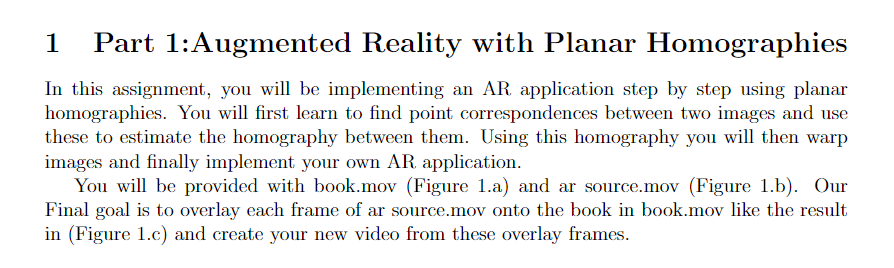

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import math
import random
import matplotlib.image as mpimg
from PIL import Image
from PIL import ImageChops
import os
from google.colab import drive
from scipy.linalg import svd

In [ ]:
drive.mount('/content/gdrive')
data_path = '/content/gdrive/MyDrive/assignment_2_materials'

subdirecList = sorted(os.listdir(data_path))
print(subdirecList)

Mounted at /content/gdrive
['ar_source.mov', 'book.mov', 'cv_cover.jpg', 'my_vid.mov', 'pano_image1.jpg', 'pano_image2.jpg', 'shanghai-21.png', 'shanghai-22.png', 'shanghai-23.png']


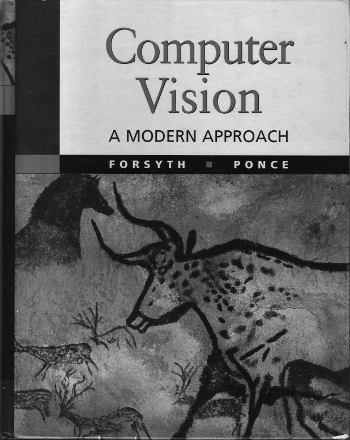

In [ ]:
trailer_vid_path = os.path.join(data_path, subdirecList[0])
book_vid_path = os.path.join(data_path, subdirecList[1])
cv_cover_path = os.path.join(data_path, subdirecList[2])

pano_image1_path = os.path.join(data_path, subdirecList[4])
pano_image2_path = os.path.join(data_path, subdirecList[5])
shanghai_21_path = os.path.join(data_path, subdirecList[6])
shanghai_22_path = os.path.join(data_path, subdirecList[7])
shanghai_23_path = os.path.join(data_path, subdirecList[8])

book_img = cv2.imread(cv_cover_path)
cv2_imshow(book_img)

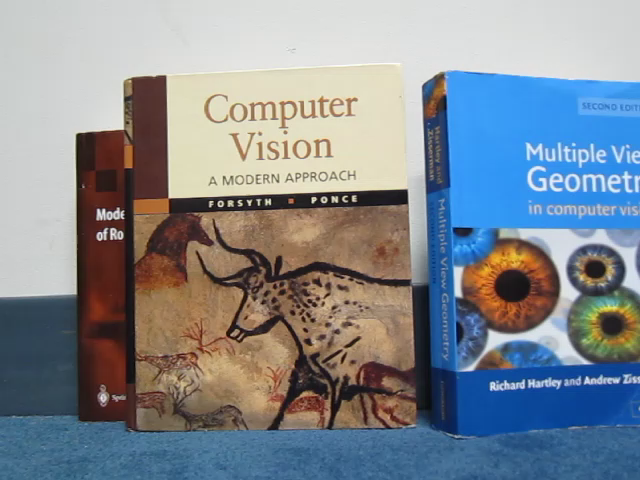

In [ ]:
# Open the video file
vid = cv2.VideoCapture(book_vid_path)
ret, first_frame = vid.read()

cv2_imshow(first_frame)

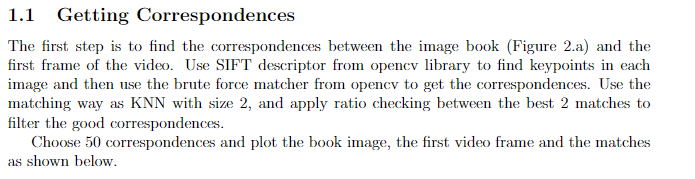

In [ ]:
def  Getting_Correspondences (image1 , image2 , threshold):

  img1_gray = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
  img2_gray = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)


  sift = cv2.SIFT_create()

  kp1, des1 = sift.detectAndCompute(img1_gray, None)
  kp2, des2 = sift.detectAndCompute(img2_gray, None)

  bf = cv2.BFMatcher()
  # Perform KNN matching with ratio test
  matches = bf.knnMatch(des1, des2, k=2)

  good_matches = []
  for m, n in matches:
    if m.distance/n.distance  < threshold :
        good_matches.append(m)

  # Sort matches based on their distances
  good_matches = sorted(good_matches, key=lambda x: x.distance)
  #print(good_matches)

  img_matches = cv2.drawMatches(image1 , kp1, image2 , kp2, good_matches[:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  #print(img_matches.shape)

  correspondances_points = []
  for match in good_matches:
      x1, y1 = kp1[match.queryIdx].pt
      x2, y2 = kp2[match.trainIdx].pt
      correspondances_points.append([x1, y1, x2, y2])

  correspondances_points = np.matrix(correspondances_points)


  return img_matches ,  correspondances_points


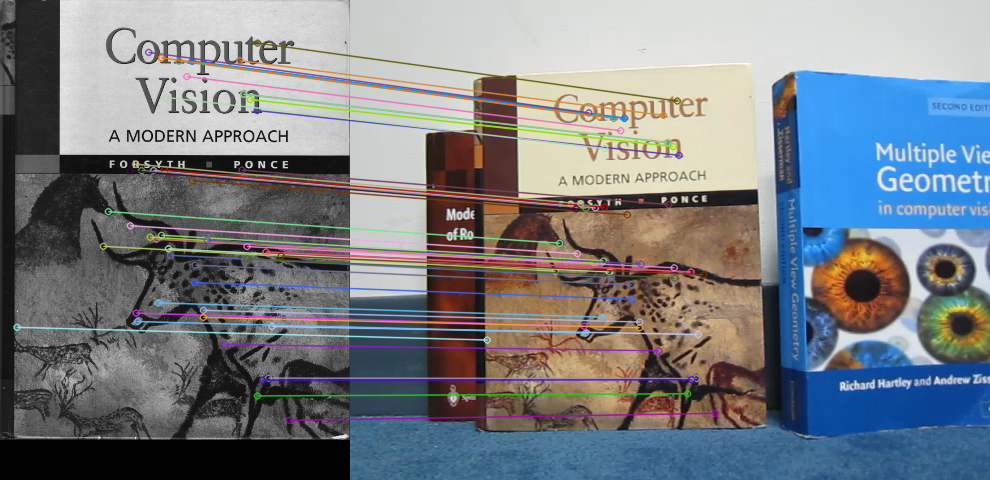

In [ ]:
matched_img , correspondances_points = Getting_Correspondences(book_img, first_frame , 0.75)
cv2_imshow(matched_img)

In [ ]:
print(correspondances_points.shape)

(487, 4)


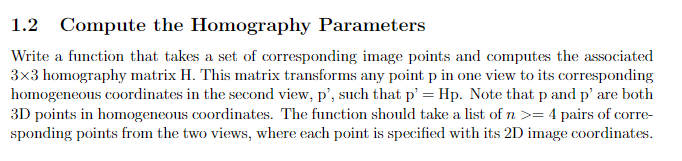

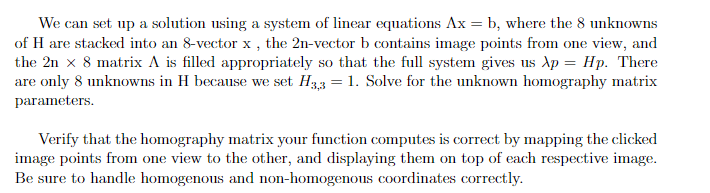

In [ ]:
def homography(points):
  A = []
  for point in points:
    x1 = point.item(0)
    y1 = point.item(1)
    x2 = point.item(2)
    y2 = point.item(3)
    A.append([-x1, -y1, -1, 0, 0, 0, x1*x2 , y1*x2 , x2])
    A.append([0, 0, 0, -x1, -y1, -1, x1*y2 , y1*y2 , y2])

  A_mat = np.matrix(A)

  #svd
  u, s, v = np.linalg.svd(A_mat)
  h = np.reshape(v[8], (3, 3))
  h = (1/h.item(8)) * h  #normalizing

  return h


In [ ]:
def Distance(p, h):
    p1 = np.transpose(np.matrix([p.item(0), p.item(1), 1]))
    ep2 = np.dot(h, p1)
    ep2 = (1/ep2.item(2)) *ep2
    p2 = np.transpose(np.matrix([p.item(2), p.item(3), 1]))
    return np.linalg.norm(p2 - ep2) , ((ep2[0]), (ep2[1]))


In [ ]:
# to take best homography matrix
def RANSAC(matched_points):
  Max_Inliers = []

  #first we choose 4 random points
  for i in range(50):
      random_points = []
      p1 = np.array(matched_points[random.randrange(0, len(matched_points))])
      p2 = np.array(matched_points[random.randrange(0, len(matched_points))])
      p3 = np.array(matched_points[random.randrange(0, len(matched_points))])
      p4 = np.array(matched_points[random.randrange(0, len(matched_points))])
      random_points.append(p1)
      random_points.append(p2)
      random_points.append(p3)
      random_points.append(p4)

      #Compute H using DLT
      homography_mat= homography(random_points)

      #count inliers
      inliers = []
      for i in range(len(matched_points)):
          dis , p= Distance(matched_points[i][0], homography_mat)
          if dis < 5:
              inliers.append(matched_points[i])


      if len(inliers) > len(Max_Inliers):
        Max_Inliers = inliers
        Hfinal = homography_mat
        temp = random_points

  return Max_Inliers , Hfinal , temp

In [ ]:
max_inliers , Hfinal, points = RANSAC(correspondances_points)
h = homography(points)
print(h)
#print(Hfinal)
#print(points)

[[ 8.08541859e-01  8.26328227e-03  1.16328851e+02]
 [-2.47736518e-02  7.94153437e-01  7.32027185e+01]
 [-2.49564635e-05 -6.13842001e-05  1.00000000e+00]]


In [ ]:
src_p=[]
des_p=[]
for i in max_inliers:
  src_p.append(i[:,:2])
  des_p.append(i[:,2:])

built_in_h, _ = cv2.findHomography(np.array(src_p), np.array(des_p))
print(built_in_h)

[[ 7.82988984e-01  5.84052260e-03  1.18556405e+02]
 [-4.61799155e-02  7.84890942e-01  7.65091898e+01]
 [-7.50520462e-05 -6.58113221e-05  1.00000000e+00]]


In [ ]:
src_p=[]
des_p=[]
for i in max_inliers:
  src_p.append(i[:,:2])
  des_p.append(i[:,2:])

actual_h2, status = cv2.findHomography(np.array(src_p), np.array(des_p))
print("actual homography\n",actual_h2)

actual homography
 [[ 7.82988984e-01  5.84052260e-03  1.18556405e+02]
 [-4.61799155e-02  7.84890942e-01  7.65091898e+01]
 [-7.50520462e-05 -6.58113221e-05  1.00000000e+00]]


In [ ]:
# Split the original list into two lists with dimensions (487, 2)
list1 = correspondances_points[:, :2]
list2 = correspondances_points[:, 2:]

# Print the dimensions of the resulting lists
print("List 1 dimensions:", list1.shape)
print("List 2 dimensions:", list2.shape)


List 1 dimensions: (487, 2)
List 2 dimensions: (487, 2)


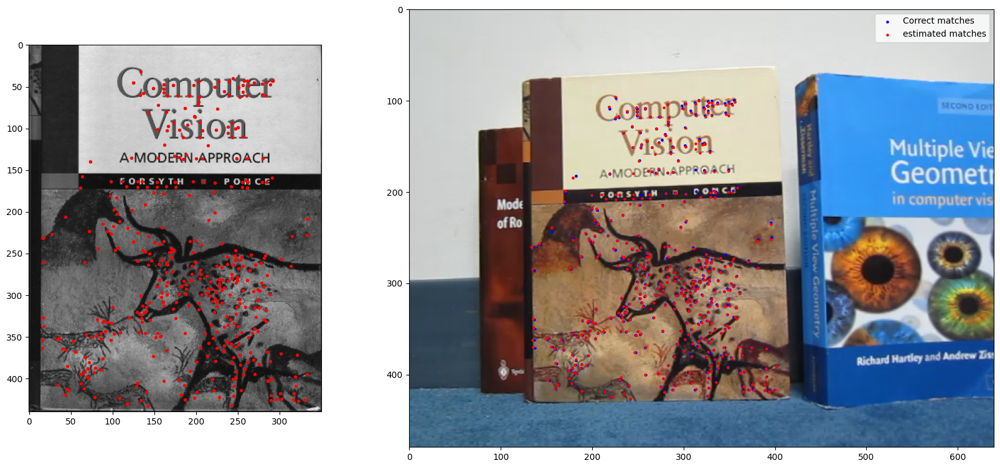

In [ ]:
figure, axis = plt.subplots(1, 2, figsize=(20, 20), gridspec_kw={'width_ratios': [1, 2]})
axis[0].imshow(cv2.cvtColor(book_img, cv2.COLOR_BGR2RGB))
axis[0].scatter(x=np.asarray(list1)[:, 0], y=np.asarray(list1)[:, 1], c='r', s=8)

p2_estimates = []
for p in correspondances_points:
  dis , point = Distance( p , h)
  p2_estimates.append(point)

#print(p2_estimates.shape)
axis[1].imshow(cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB))
axis[1].scatter(x=np.asarray(list2)[:, 0], y=np.asarray(list2)[:, 1], c='b', s=5, label= 'Correct matches')
axis[1].scatter(x=np.asarray(p2_estimates)[:, 0], y=np.asarray(p2_estimates)[:, 1], c='r', s=5, label= 'estimated matches')
axis[1].legend()

plt.show()

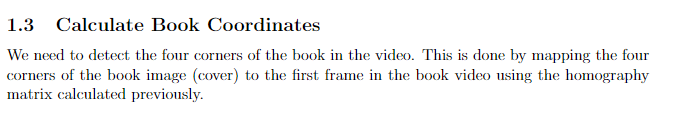

In [ ]:
def p_dash(h, p):
  p = np.transpose([p[0], p[1], 1])
  p_dash = np.dot(h, p)
  # normalize first 2 coordinates
  p_dash /= p_dash[0,2]
  return (int(p_dash[0,0]), int(p_dash[0,1]))

In [ ]:
def calculate_corners(img, h):
  img_shape = img.shape
  # the four corners of the book in the image
  p1_dash = p_dash(h, (0, 0))
  p2_dash = p_dash(h, (img_shape[1], 0))
  p3_dash = p_dash(h, (img_shape[1], img_shape[0]))
  p4_dash = p_dash(h, (0, img_shape[0]))

  return p1_dash, p2_dash, p3_dash, p4_dash

In [ ]:
def ROI(p1, p2, p3, p4, frame):
  # region of interest
  polygons = np.array([
      [p1 , p2, p3, p4,]
      ])
  mask = np.zeros_like(frame)
  cv2.fillPoly(mask, np.int32(polygons), (255, 255, 255))
  return mask

book corners in the image:
 [[  0   0]
 [350   0]
 [350 440]
 [  0 440]]
book corners in the first video frame:

(116, 73)
(402, 65)
(417, 429)
(123, 434)


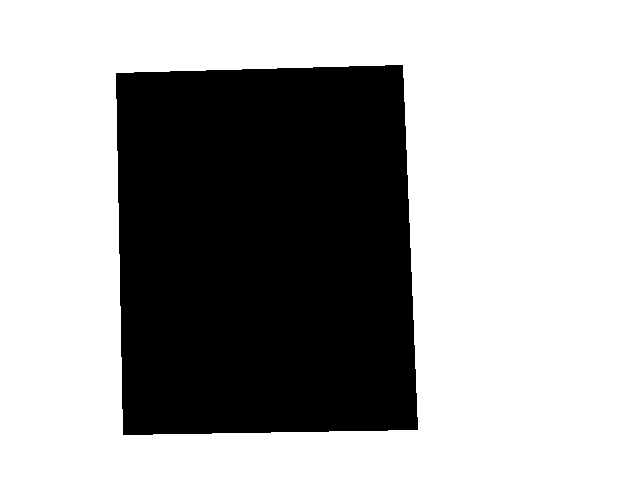

In [ ]:
book_corners = np.array([[0, 0], [book_img.shape[1], 0],
                         [book_img.shape[1], book_img.shape[0]], [0, book_img.shape[0]]])
print("book corners in the image:\n" , book_corners)

p1_dash, p2_dash, p3_dash, p4_dash = calculate_corners(book_img, h)
print("book corners in the first video frame:\n")
print(p1_dash)
print(p2_dash)
print(p3_dash)
print(p4_dash)
mask = np.invert(ROI(p1_dash, p2_dash, p3_dash, p4_dash, first_frame))
cv2_imshow(mask)

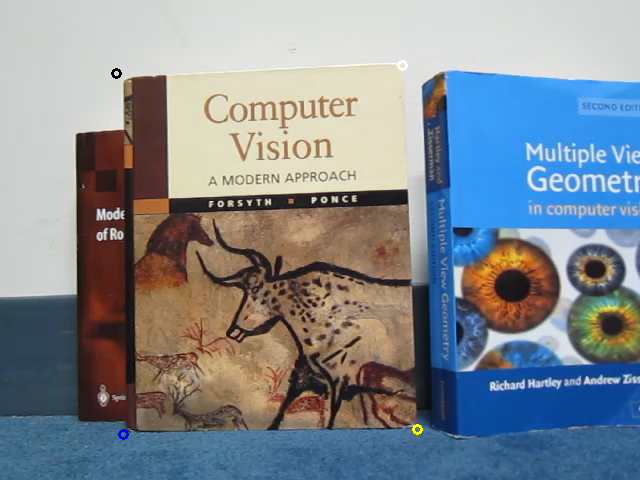

In [ ]:
# draw corners
img_copy = first_frame.copy()
cv2.circle(img_copy, (p1_dash[0], p1_dash[1]), radius=4, color= (0, 0, 0), thickness=2)
cv2.circle(img_copy, (p2_dash[0], p2_dash[1]), radius=4, color= (255, 255, 255), thickness=2)
cv2.circle(img_copy, (p3_dash[0], p3_dash[1]), radius=4, color= (0, 255, 255), thickness=2)
cv2_imshow(cv2.circle(img_copy, (p4_dash[0], p4_dash[1]), radius=4, color= (255, 0, 0), thickness=2))

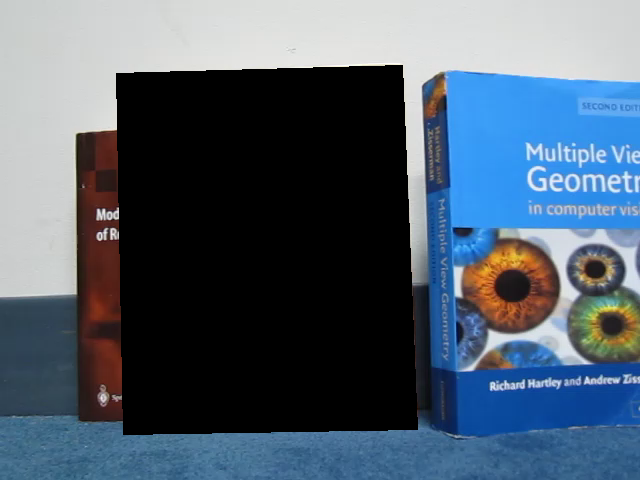

In [ ]:
masked_frame = cv2.bitwise_and(mask , first_frame)
cv2_imshow(masked_frame)

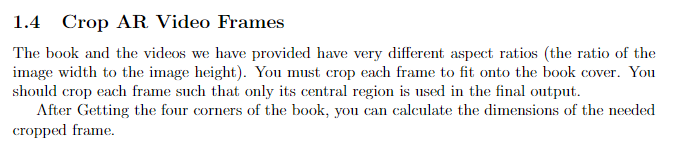

In [ ]:
def crop_resize_frame(frame):
  frame_shape = frame.shape
  book_img_shape = book_img.shape
  temp = int((frame_shape[1] - book_img_shape[1]) / 2)     # crop the same size from both sides to be the same size of the book image
  crop_bb = 45     # crop the upper and lower black borders
  cropped_frame = frame[crop_bb:frame_shape[0]-crop_bb, temp:frame_shape[1]-temp]
  resized_frame = cv2.resize(cropped_frame, (book_img_shape[1], book_img_shape[0]))
  return resized_frame

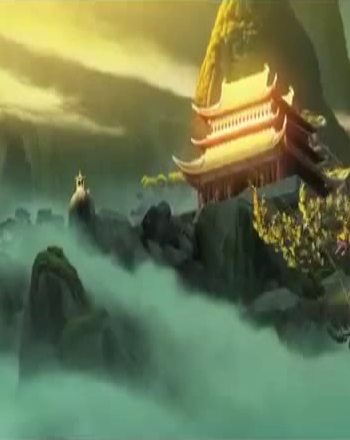

In [ ]:
trailer_vid = cv2.VideoCapture(trailer_vid_path)
ret, trailer_first_frame = trailer_vid.read()

crop = crop_resize_frame(trailer_first_frame)
cv2_imshow(crop)

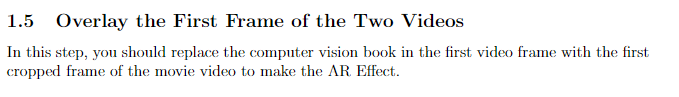

In [ ]:
def warp_frame(trailer_frame, book_frame, p1, p2, p3, p4, h_matrix):
  # p1:p4 are the 4 corners after applying the homography matrix

  trailer_frame_shape = trailer_frame.shape
  book_frame_shape = book_frame.shape
  book_img_shape = book_img.shape

  src_pts = np.float32([[0, 0], [book_img_shape[1], 0], [0, book_img_shape[0]], [book_img_shape[1], book_img_shape[0]]])
  dest_pts = np.float32([p1, p2, p4, p3])

  # # calculate the perspective transformation matrix (M) using source and destination points
  # M = cv2.getPerspectiveTransform(src_pts, dest_pts)

  # apply the perspective transformation to the input trailer frame and show the output image in the same size of book frame
  result = cv2.warpPerspective(trailer_frame, h_matrix, (book_frame_shape[1], book_frame_shape[0]))

  return result

In [ ]:
def draw_on_book(trailer_frame, book_frame, my_mask):
  final_img = cv2.bitwise_and(my_mask , book_frame)
  final = cv2.bitwise_or(final_img , trailer_frame)
  return final

In [ ]:
def overlay(trailer_frame, book_frame, my_mask, p1, p2, p3, p4, h_matrix):
  cropped_frame = crop_resize_frame(trailer_frame)

  # print("trailer frame after being cropped:")
  # cv2_imshow(cropped_frame)

  warped_frame = warp_frame(cropped_frame, book_frame, p1, p2, p3, p4, h_matrix)

  # print("trailer frame after being warped:")
  # cv2_imshow(warped_frame)

  final = draw_on_book(warped_frame, book_frame, my_mask)
  return final

original trailer frame:


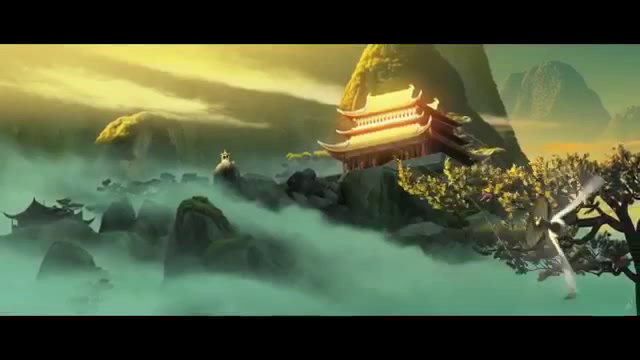

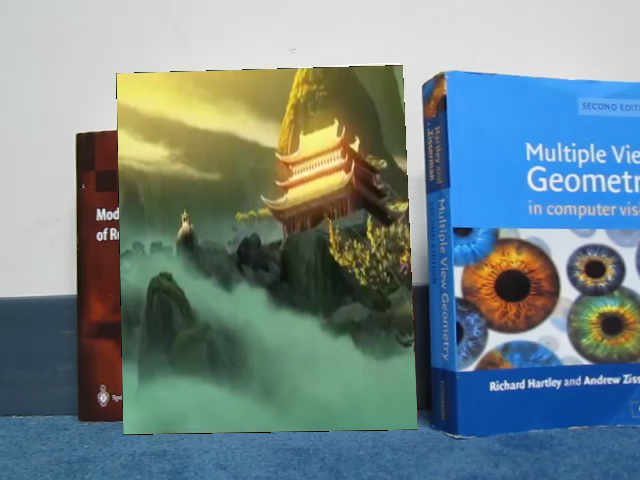

In [ ]:
print("original trailer frame:")
cv2_imshow(trailer_first_frame)

res = overlay(trailer_first_frame, first_frame, mask, p1_dash, p2_dash, p3_dash, p4_dash, h)
cv2_imshow(res)

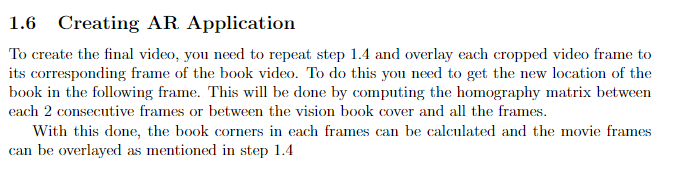

In [ ]:
def over_overlay(trailer_frame, book_frame, book_image):
  matchedImg , correspondancesPoints = Getting_Correspondences(book_image, book_frame , 0.75)
  maxInliers , hFinal, Points = RANSAC(correspondancesPoints)
  homo = homography(Points)
  p1Dash, p2Dash, p3Dash, p4Dash = calculate_corners(book_image, homo)
  myMask = np.invert(ROI(p1Dash, p2Dash, p3Dash, p4Dash, book_frame))
  over_img = overlay(trailer_frame, book_frame, myMask, p1Dash, p2Dash, p3Dash, p4Dash, homo)
  return over_img

In [ ]:
def loadVid(path):
	# create a VideoCapture object and read from input file
	cap = cv2.VideoCapture(path)

	# Check if camera opened successfully
	if (cap.isOpened()== False):
		print("Error opening video stream or file")

	i = 0
	while(cap.isOpened()):
		# capture frame-by-frame
		i += 1
		ret, frame = cap.read()
		if ret == True:
			# store the resulting frame
			if i == 1:
				frames = frame[np.newaxis, ...]
			else:
				frame = frame[np.newaxis, ...]
				frames = np.vstack([frames, frame])
				frames = np.squeeze(frames)

		else:
			break

	# when everything done, release the video capture object
	cap.release()

	return frames

In [ ]:
def create_ar_app(trailer_frames, book_frames, book_image):
  height, width, _ = book_frames[0].shape
  fourcc = cv2.VideoWriter_fourcc(*'XVID')
  video = cv2.VideoWriter(data_path + '/my_vid_h.mov', fourcc, 20.0, (width,height))

  for i in range(min(book_frames.shape[0], trailer_frames.shape[0])):
  # for i in range(200):
    # cv2_imshow(trailer_frames[i])
    # cv2_imshow(book_frames[i])
    over_layed_frame = over_overlay(trailer_frames[i], book_frames[i], book_image)
    cv2_imshow(over_layed_frame)
    # add frame to video
    print('Adding frame ', i)
    video.write(over_layed_frame)

  video.release()

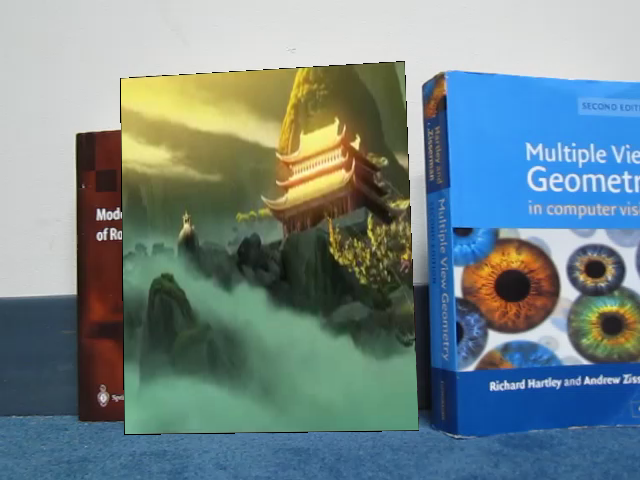

Adding frame  0


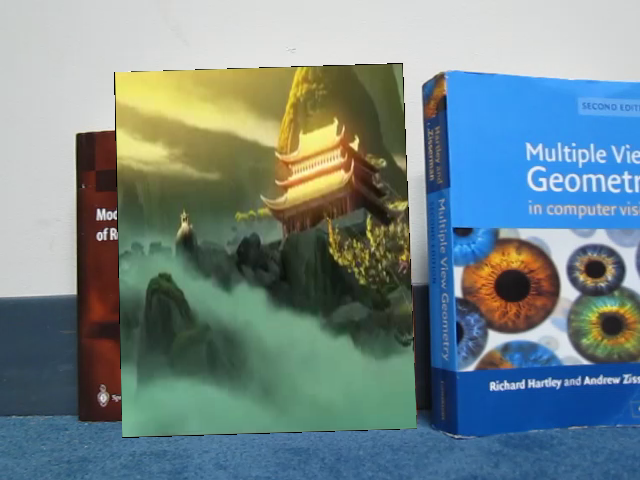

Adding frame  1


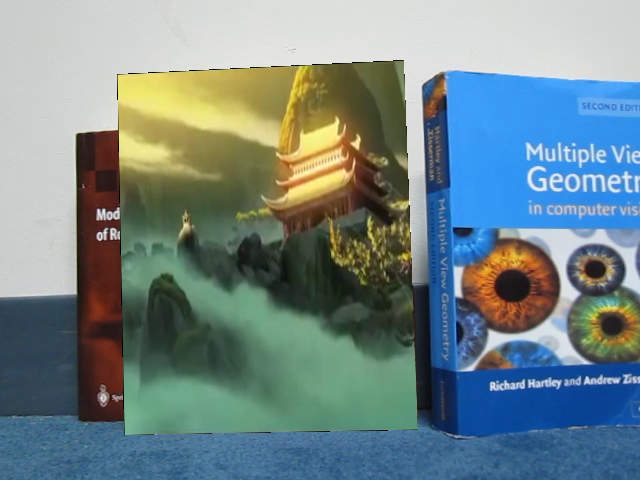

Adding frame  2


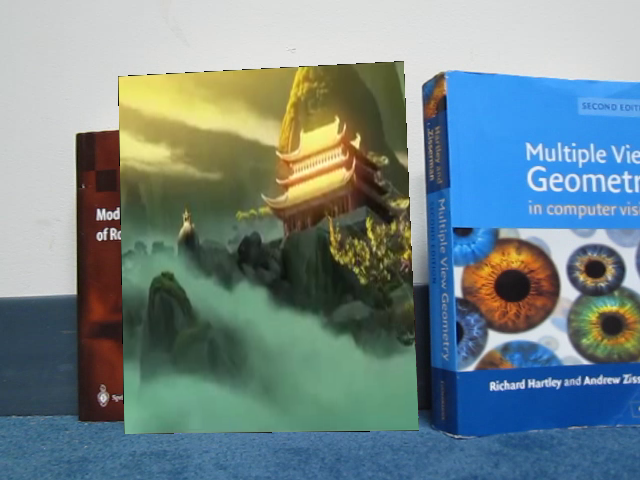

Adding frame  3


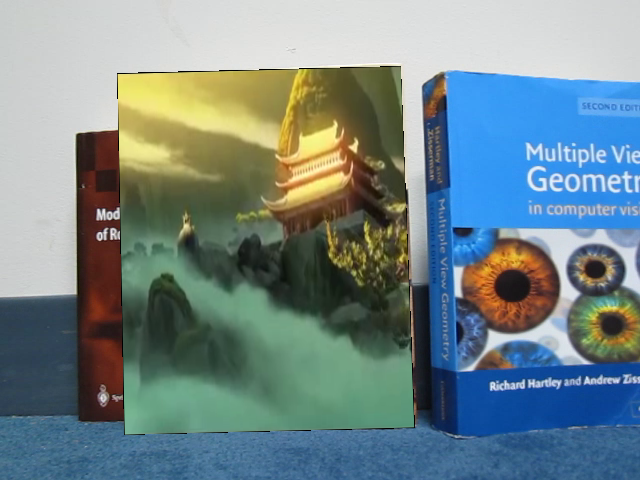

Adding frame  4


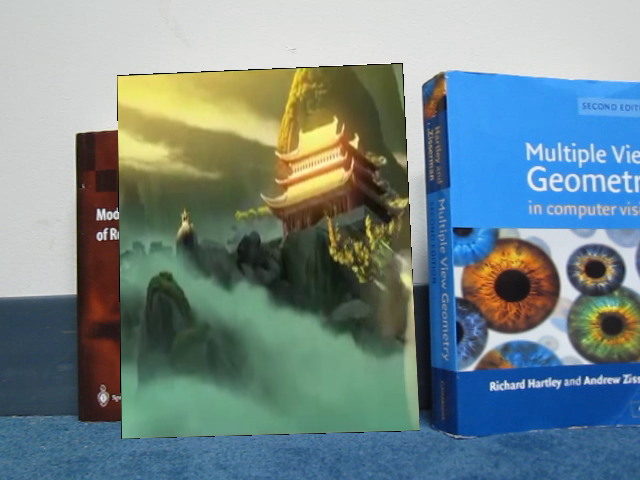

Adding frame  5


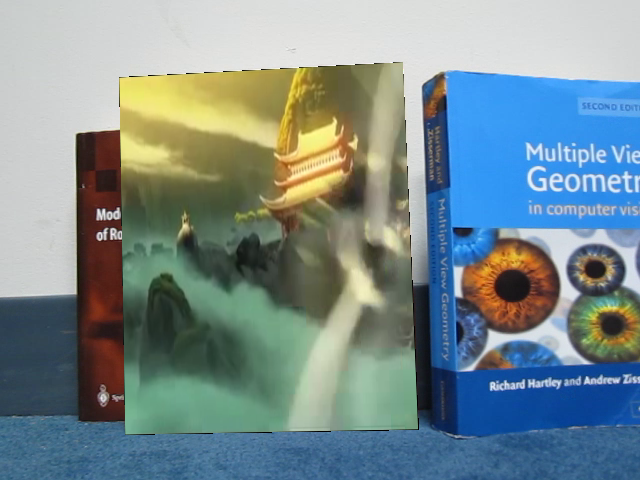

Adding frame  6


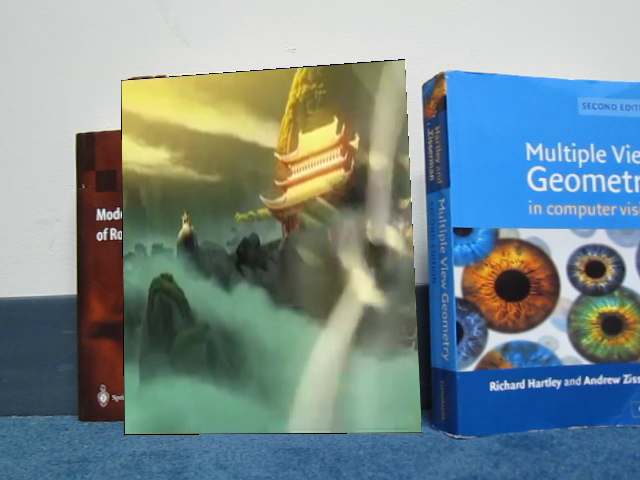

Adding frame  7


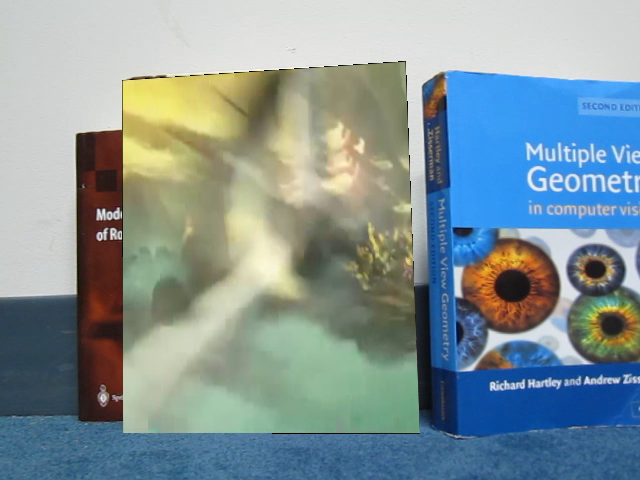

Adding frame  8


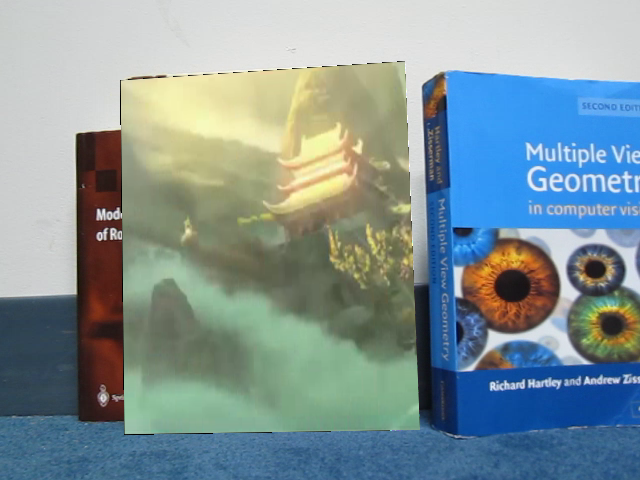

Adding frame  9


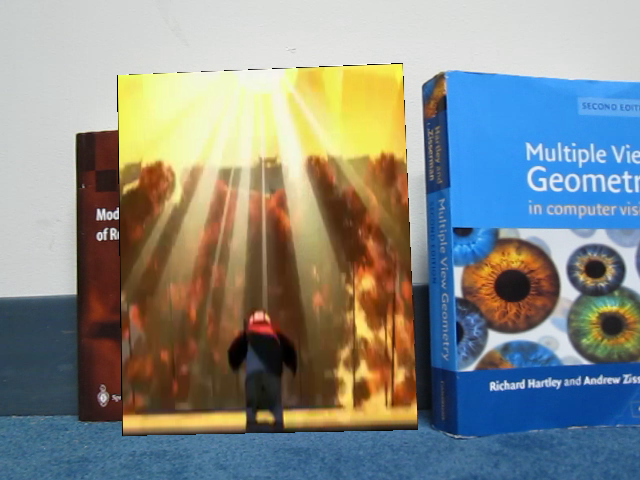

Adding frame  10


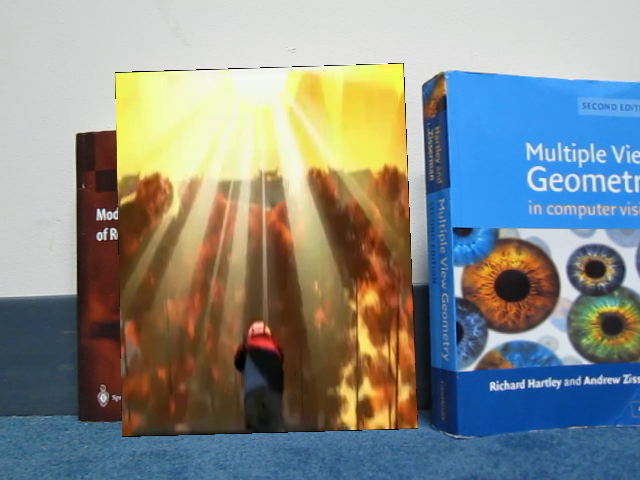

Adding frame  11


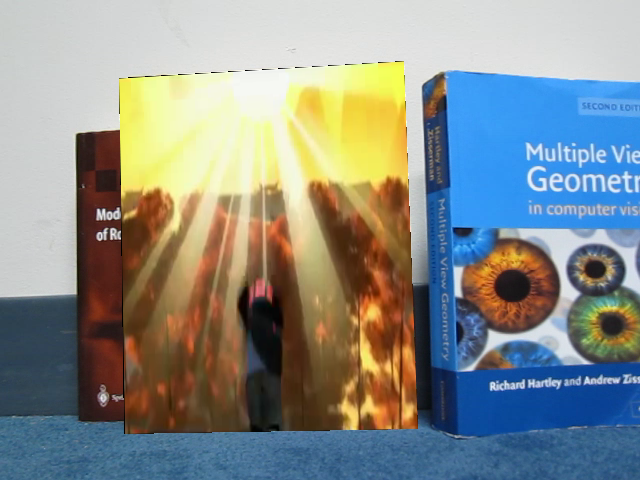

Adding frame  12


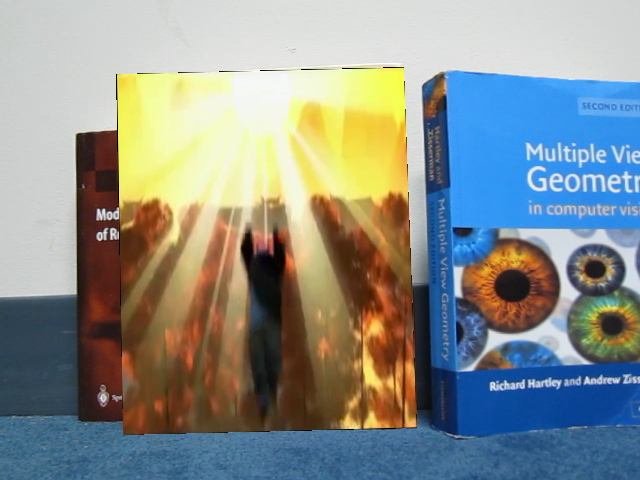

Adding frame  13


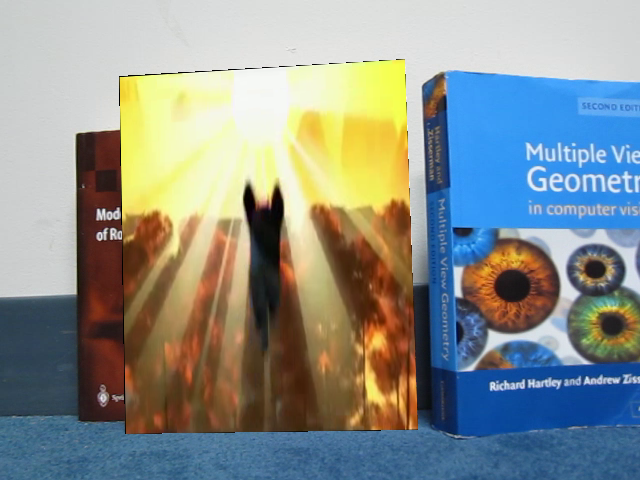

Adding frame  14


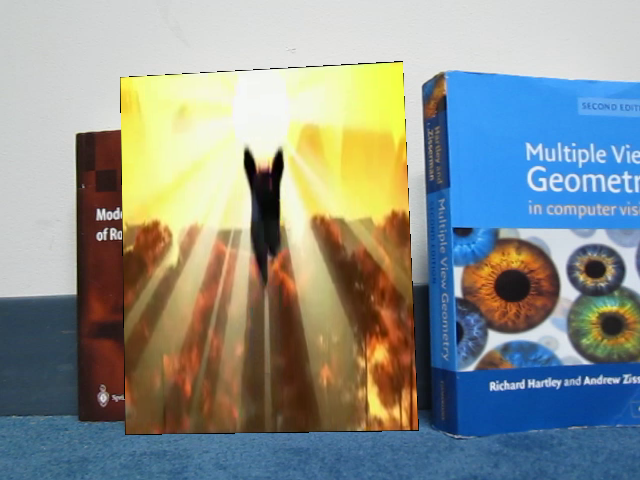

Adding frame  15


KeyboardInterrupt: ignored

In [ ]:
trailer_frames = loadVid(trailer_vid_path)
book_frames = loadVid(book_vid_path)

create_ar_app(trailer_frames, book_frames, book_img)